# To run this code

### 1. Setting GPU in notebook setting (refer to below image)
 - ① Click "Runtime" in menu
 - ② Click "Change runtime type"
 - ③ Set Hardware accelerator as "GPU" 
 - ④ Click "Save"

<img src="https://github.com/SoyoungLee8/TLspine_FxLevel_Segmentation/blob/cb74eed4ae6ca30667403aeb52ff7ad25843adba/notebook/image1.png?raw=true">

### 2. Run the code (Keep pressing "Shift + Enter" key until the end of the code blocks)
- If a warning message appeared, just click "Run anyway"
- There are 4 session in this codes;
- "1.Load library"
- "2.Load pretrained model"
- "3.Prepare test dataset"
- "4.Inference result"

### 3. If you have additional image to diagnosis (refer to below image)
- ① Click folder button on the bottom of left sidebar
- ② Click "TLspine_FxLevel_Segmentation" to expand the tree structure
- ③ Drag and drop your L-spine lateral X-ray images to "TLspine_FxLevel_Segmentation/input_data" (only .png, .jpg, .tif format)
- ④ Run the code from "3.Prepare test dataset" (By using "Shift + Enter")

<img src="https://github.com/SoyoungLee8/TLspine_FxLevel_Segmentation/blob/cb74eed4ae6ca30667403aeb52ff7ad25843adba/notebook/image2.png?raw=true">


## 1. Loading library

In [1]:
!git clone https://github.com/SoyoungLee8/TLspine_FxLevel_Segmentation.git
%cd TLspine_FxLevel_Segmentation/

!pip install -U monai==0.8.0 pytorch_lightning
!pip install --upgrade https://github.com/VincentStimper/mclahe/archive/numpy.zip
!pip install --upgrade gdown
!pip install git+https://github.com/qubvel/segmentation_models.pytorch

Cloning into 'TLspine_FxLevel_Segmentation'...
remote: Enumerating objects: 65, done.
remote: Counting objects: 100% (65/65), done.
remote: Compressing objects: 100% (56/56), done.
remote: Total 65 (delta 22), reused 35 (delta 7), pack-reused 0
Unpacking objects: 100% (65/65), 11.03 MiB | 5.57 MiB/s, done.
/content/TLspine_FxLevel_Segmentation
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 709.8/709.8 kB 47.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.0/719.0 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 53.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 73.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 19.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.6/149.6 kB 19.7 MB/s et

In [2]:
# load pretrained model
import lightening_segmenter
import model_multitask
import torchmetrics
import monai

# prepare test dataset
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import albumentations as albu
import numpy as np
import dataset
import natsort
import mclahe
import torch
import glob
import cv2
import os

# inference result
import matplotlib.patches as mpatches
from scipy.ndimage import label
import postprocessing as post

## 2. Load pretrained model

In [3]:
# define loss and metric function
lossfn = monai.losses.DiceFocalLoss(to_onehot_y=True)
metricfn = torchmetrics.functional.dice

# model
experiment_name = 'ours'
net = model_multitask.Unet()
model = lightening_segmenter.Segmentor(network=net, lossfn=lossfn, metricfn=metricfn, experiment_name=experiment_name,)

# load pretrained weight
!gdown https://drive.google.com/uc?id=1wgl5iDbpmPbIdQDCoQMwJXPs6m2jBI7e -O epoch=16-step=7938.ckpt
model.load_from_checkpoint(network=net, lossfn=lossfn, metricfn=metricfn, experiment_name=experiment_name,checkpoint_path='epoch=16-step=7938.ckpt')
model = model.cuda()

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth
100%|██████████| 170M/170M [00:02<00:00, 69.6MB/s]


Downloading...
From (uriginal): https://drive.google.com/uc?id=1wgl5iDbpmPbIdQDCoQMwJXPs6m2jBI7e
From (redirected): https://drive.google.com/uc?id=1wgl5iDbpmPbIdQDCoQMwJXPs6m2jBI7e&confirm=t&uuid=53c07837-d52e-4769-b287-2b34ded0fdca
To: /content/TLspine_FxLevel_Segmentation/epoch=16-step=7938.ckpt
100% 758M/758M [00:18<00:00, 41.7MB/s]


INFO:pytorch_lightning.utilities.migration.utils:Lightning automatically upgraded your loaded checkpoint from v1.5.0 to v2.0.2. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file epoch=16-step=7938.ckpt`


# 3. Prepare test dataset

- Load files from "./TLspine_FxLevel_Segmentation/test_data/" folder
- All datas get from google search
- If you have L-spine lateral X-ray to analyze, upload file to "test_data" (.png, .jpg, .tif)

In [4]:
x_etest = natsort.natsorted(glob.glob(os.path.join('test_data','*')))
# delete README file
if 'test_data/README.md' in x_etest:
    del x_etest[x_etest.index('test_data/README.md')]
print(x_etest)

albu_transform = [
                # albu.Normalize(mean= 3028.37, std = 1720.31, max_pixel_value=1.0),
                albu.LongestMaxSize(max_size=1024, interpolation=cv2.INTER_CUBIC, p=1), 
                albu.PadIfNeeded(border_mode=cv2.BORDER_CONSTANT, min_height=1024, min_width=1024, p=1)
            ]
            
transforms = albu.Compose(albu_transform)

class test_dataset() : 
    def __init__(self, data) :
        self.data = data
    def __len__(self):
        return len(self.data)
    def __getitem__(self, idx):
        fname = self.data[idx]
        image = cv2.imread(fname)
        # outlier clip
        x_cutoff_max = int(np.percentile(image, 99))
        image_clip = image.clip(0, x_cutoff_max)
        # normalization, resize
        sample = transforms(image=image_clip)
        image_transform = sample['image']
        # clahe
        image_clahe = dataset.clahe(image_transform.astype(np.float32),True)
        image_clahe = np.moveaxis(image_clahe,-1,0)
        image_clahe = torch.tensor(image_clahe)

        return {'image':image_clahe, 'fname':fname}

etest_ds = test_dataset(data=x_etest)
etest_loader = DataLoader(etest_ds, batch_size=1, shuffle=False, num_workers=1, pin_memory=True)

['test_data/A-radiograph-of-lateral-lumbar-spine-Compression-fracture-of-L4-vertebral-body-is.png', 'test_data/L-spine-lateral-X-ray-showed-compression-fracture-of-L1-L4-and-L5.png', 'test_data/brain-and-spine-case-8-1.jpg', 'test_data/lumbar-compression-fx.jpg', 'test_data/vcfrac2.jpg', 'test_data/vertebral-img-1.jpg']


test_data/A-radiograph-of-lateral-lumbar-spine-Compression-fracture-of-L4-vertebral-body-is.png


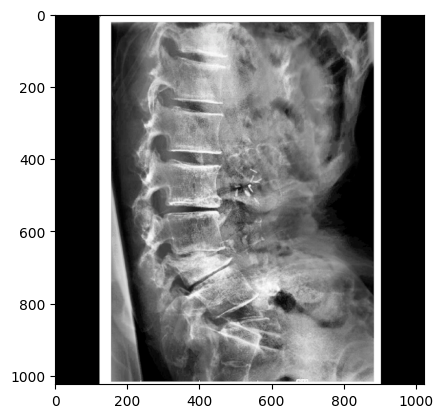

In [5]:
# # testset sample show
iterator = iter(etest_loader)
batch = next(iterator)
############################# DEPEND ON DATASET #################################
image, fname = batch['image'], batch['fname']
#################################################################################
for idx in range(len(image)):
    print(fname[idx])
    plt.imshow(image[idx].permute(1,2,0), cmap='gray')
    plt.show()


# 4. Inference result

In [6]:
# helper function for data visualization
def plot_(img, alpha):    
    try:
        plt.imshow(img.cpu().detach().numpy(), cmap='gray', alpha=alpha)
    except:
        plt.imshow(img,cmap='gray',alpha=alpha)

def plot_color(img, alpha, max_v):
    try:
        im = plt.imshow((img.cpu().detach().numpy())/max_v, cmap='nipy_spectral', vmin=0.0, vmax=1.0, alpha=alpha) # bone, afmhat 
    except:
        im = plt.imshow(img/max_v ,cmap='nipy_spectral', vmin=0.0, vmax=1.0, alpha=alpha)
    return im, np.unique(img/max_v)

def plot_level(img, alpha):
    img_s = np.where(img==3, img, 0)
    img_s[img_s==3] = 7
    img_t = np.where(img==2, img, 0)
    img_t[img_t==2] = 6
    img_l = np.where(img==1, img, 0)
    image = np.zeros_like(img)
    lspines, _ = label(img_l)
    image = img_s + lspines + img_t

    im, values = plot_color(image,alpha, 7)

    colors = [ im.cmap(im.norm(value)) for value in values]
    leg_label = ['Background', 'L1', 'L2', 'L3', 'L4', 'L5', 'T-spine', 'Sacrum']
    patches = [ mpatches.Patch(color=colors[i], label="{l}".format(l=leg_label[i]) ) for i in range(len(values)) ]
    plt.legend(handles=patches, fontsize='xx-large')

def visualize(fname=None,**images):
    """Plot images in one row."""
    
    n = len(images)
    # plt.figure(figsize=(26, 12))
    plt.figure(figsize=(52, 24))
    
    for i, (name, image) in enumerate(images.items()):
        if torch.is_tensor(image) and image.shape[0] == 3:
            image = image.permute(1,2,0)#.int()
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title(), fontsize=35)
        if i == 0:
            image_ori = image
            plot_(image_ori,1)
        elif i == 1:
            plot_(image_ori,1)
            im, values = plot_color(image,0.7,3)
            # add legend
            colors = [ im.cmap(im.norm(value)) for value in values]
            leg_label = ['Background', 'Normal', 'VCF', 'Sacrum']
            patches = [ mpatches.Patch(color=colors[i], label="{l}".format(l=leg_label[i]) ) for i in range(len(values)) ]
            plt.legend(handles=patches, fontsize='xx-large')
        else:
            plot_(image_ori,1)
            plot_level(image,0.7)
    plt.show()

add L1
the below image is test_data/A-radiograph-of-lateral-lumbar-spine-Compression-fracture-of-L4-vertebral-body-is.png


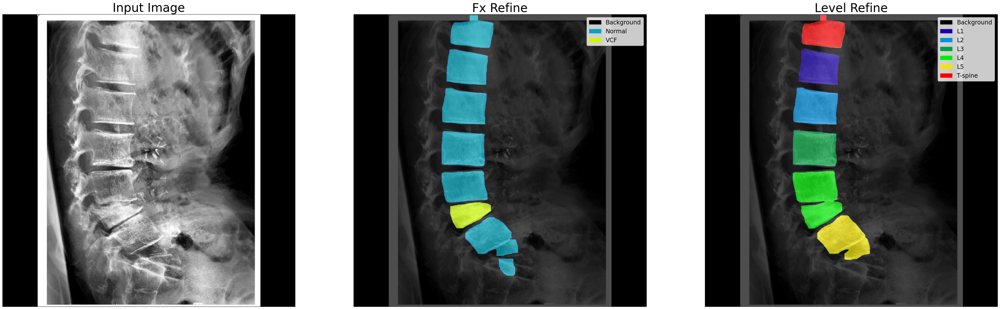

the below image is test_data/L-spine-lateral-X-ray-showed-compression-fracture-of-L1-L4-and-L5.png


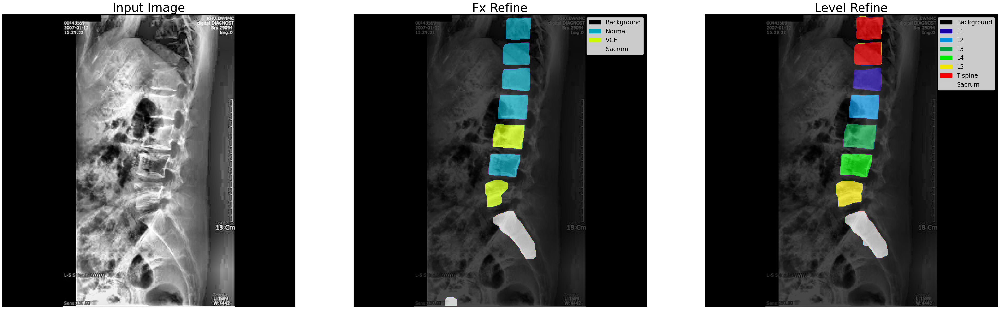

the below image is test_data/brain-and-spine-case-8-1.jpg


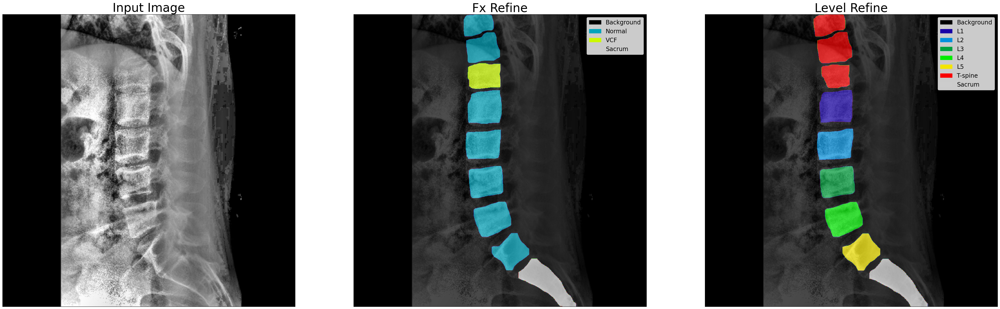

the below image is test_data/lumbar-compression-fx.jpg


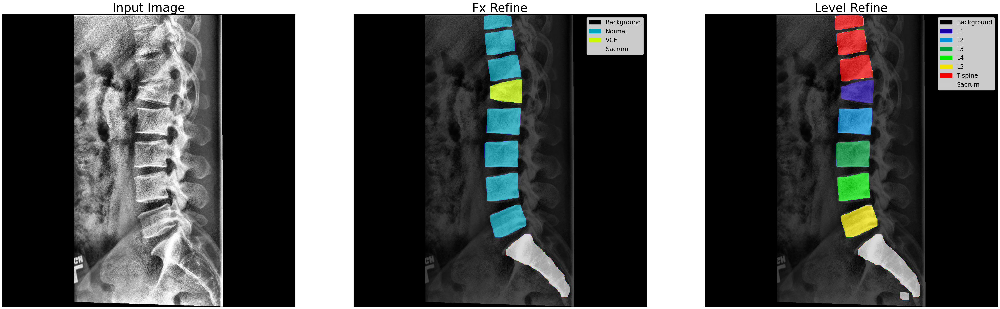

the below image is test_data/vcfrac2.jpg


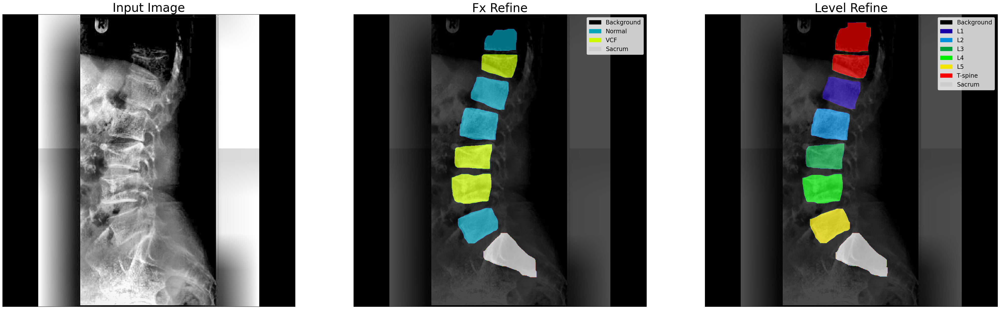

add L1
the below image is test_data/vertebral-img-1.jpg


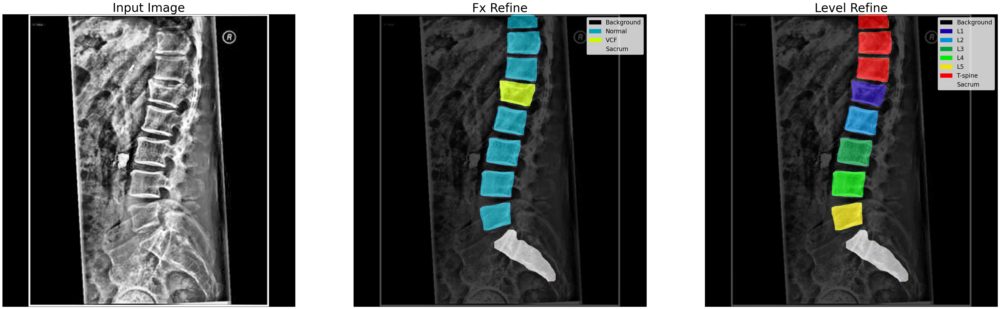

In [7]:
for idx, batch in enumerate(etest_loader) : 
    x = batch['image']
    fname = batch['fname']
    yhat = model(x.cuda())
    yhat_position = post.refine_position(yhat[1])
    yhat_fracture = post.refine_fracture(yhat[0])
    for idx in range(len(x)):
        print(f'the below image is {fname[idx]}')
        visualize(fname=fname[idx], input_image=x[idx,0], fx_refine=yhat_fracture[idx,0], level_refine=yhat_position[idx,0])
